Precompiling HopTB
  ✓ HopTB
  1 dependency successfully precompiled in 12 seconds. 46 already precompiled.
sys:1: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown


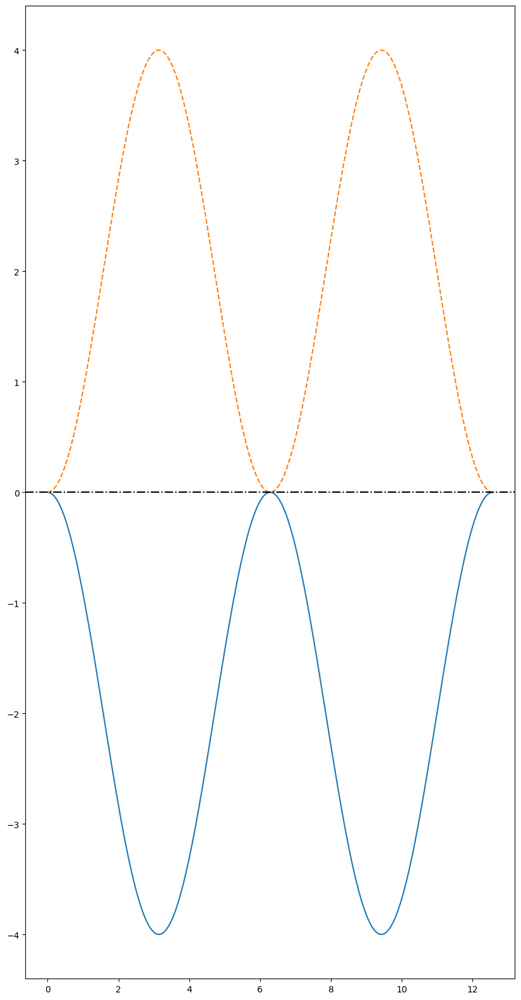

In [52]:
using HopTB,LinearAlgebra
using PyPlot,Plots
lat = [1.0 0.0 0.0; 0.0 1.0 0.0; 0.0 0.0 1.0]
BN = TBModel(2, lat)
# 子晶格 A 的位置 (在晶格点 [0, 0, 0])
setposition!(BN, [0, 0, 0], 1, 1, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 1, 1, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 1, 1, 3, (BN.lat * [0, 0, 0])[3])

# 子晶格 B 的位置 (在晶格点 [a/2, a/2, 0])
setposition!(BN, [0, 0, 0], 2, 2, 1, (BN.lat * [1/2, 1/2, 0])[1])
setposition!(BN, [0, 0, 0], 2, 2, 2, (BN.lat * [1/2, 1/2, 0])[2])
setposition!(BN, [0, 0, 0], 2, 2, 3, (BN.lat * [1/2, 1/2, 0])[3])


# Parameters
t = 0.02
λ =0
J1 = 1.0
J2 = 1.0

# 1. -t(cos(kx) + cos(ky)) * σ0
# 作用在哈密顿量的对角线元素上
sethopping!(BN, [1, 0, 0], 1, 1, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 1, 1, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [1, 0, 0], 2, 2, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 2, 2, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 2, 2, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 2, 2, -t) # 反向的ky跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 1, 1, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 1, 1, -t) # 反向的ky跳跃 (σ0)


# 2. (λ/2) * [sin(kx + ky) * σx + sin(ky - kx) * σy]
# 作用在哈密顿量的非对角线元素上 (σx, σy)
sethopping!(BN, [1, 1, 0], 1, 2, λ/2)  # kx+ky方向上的跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 1, 2, λ/2)  # 反向跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 2, 1, λ/2) # 反向跳跃 (σx)
sethopping!(BN, [1, 1, 0], 2, 1, λ/2)  # kx+ky方向上的跳跃 (σx)

sethopping!(BN, [1, -1, 0], 1, 2, -im*λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 1, 2, -im*λ/2) # 反向跳跃 (σy)
sethopping!(BN, [1, -1, 0], 2, 1, im*λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 2, 1, im*λ/2) # 反向跳跃 (σy)

# 3. J1 * (cos(kx) - cos(ky)) + J2 * sin(kx) * sin(ky) * σz
# 作用在哈密顿量的对角线元素上 (σz)
sethopping!(BN, [1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
sethopping!(BN, [-1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
sethopping!(BN, [0, 1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
sethopping!(BN, [0, -1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
sethopping!(BN, [1, 1, 0], 1, 1, J2)    # kx+ky方向的跳跃 (σz)
sethopping!(BN, [-1, -1, 0], 1, 1, J2)  # 反向跳跃 (σz)
sethopping!(BN, [1, -1, 0], 1, 1, -J2)    # kx+ky方向的跳跃 (σz)
sethopping!(BN, [-1, 1, 0], 1, 1, -J2)  # 反向跳跃 (σz)
sethopping!(BN, [1, 0, 0], 2, 2, -J1)  # kx方向上的跳跃 (σz)
sethopping!(BN, [-1, 0, 0], 2, 2, -J1)   # kx方向上的跳跃 (σz)
sethopping!(BN, [0, 1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
sethopping!(BN, [0, -1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
sethopping!(BN, [1, 1, 0], 2, 2, -J2)    # kx+ky方向的跳跃 (σz)
sethopping!(BN, [-1, -1, 0], 2, 2, -J2)  # 反向跳跃 (σz)
sethopping!(BN, [1, -1, 0], 2, 2, J2)    # kx+ky方向的跳跃 (σz)
sethopping!(BN, [-1, 1, 0], 2, 2, J2)  # 反向跳跃 (σz)



kpath = zeros(Float64, 3, 5)
kpath[:, 1] = [0.5, 0.5, 0.0]  # M
kpath[:, 2] = [0.0, 0.5, 0.0]  # X
kpath[:, 3] = [0.0, 0.0, 0.0]  # Γ
kpath[:, 4] = [0.5, 0.0, 0.0]  # Y
kpath[:, 5] = [0.5, 0.5, 0.0]  # Γ
kdist, egvals = HopTB.BandStructure.getbs(BN, kpath, 50, connect_end_points=true)

fig = figure("Band structure monolayer hBN",figsize=(10,20))

max_val=findmax(egvals[1,:])[1]
egvals=egvals.-max_val

plot(kdist,egvals[1,:],linestyle="-")
plot(kdist,egvals[2,:],linestyle="--")
PyPlot.axhline(0.0,color="black",linestyle="-.")
PyPlot.show()



fs = HopTB.BandStructure.get_fermi_surfaces(BN, [50, 50,50], [1]; fermi_energy=0.15)
for fsc in fs
    scatter(fs.ks[1, :], fs.ks[2, :], zcolor=fs.weights, colorbar=true, xlabel="kx", ylabel="ky", title="Fermi Surface")
end

LoadError: ArgumentError: Package Plots not found in current path.
- Run `import Pkg; Pkg.add("Plots")` to install the Plots package.

In [48]:
using HopTB,LinearAlgebra
using PyPlot,Plots
lat = [1.0 0.0 0.0; 0.0 1.0 0.0; 0.0 0.0 1.0]
BN = TBModel(2, lat)
# 子晶格 A 的位置 (在晶格点 [0, 0, 0])
setposition!(BN, [0, 0, 0], 1, 1, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 1, 1, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 1, 1, 3, (BN.lat * [0, 0, 0])[3])

# 子晶格 B 的位置 (在晶格点 [a/2, a/2, 0])
setposition!(BN, [0, 0, 0], 2, 2, 1, (BN.lat * [1/2, 1/2, 0])[1])
setposition!(BN, [0, 0, 0], 2, 2, 2, (BN.lat * [1/2, 1/2, 0])[2])
setposition!(BN, [0, 0, 0], 2, 2, 3, (BN.lat * [1/2, 1/2, 0])[3])


# Parameters
t = 0.02
λ =0.4
J1 = 1.0
J2 = 1.0

# 1. -t(cos(kx) + cos(ky)) * σ0
# 作用在哈密顿量的对角线元素上
sethopping!(BN, [1, 0, 0], 1, 1, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 1, 1, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [1, 0, 0], 2, 2, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 2, 2, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 2, 2, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 2, 2, -t) # 反向的ky跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 1, 1, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 1, 1, -t) # 反向的ky跳跃 (σ0)


# 2. (λ/2) * [sin(kx + ky) * σx + sin(ky - kx) * σy]
# 作用在哈密顿量的非对角线元素上 (σx, σy)
sethopping!(BN, [1, 1, 0], 1, 2, λ/2)  # kx+ky方向上的跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 1, 2, λ/2)  # 反向跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 2, 1, λ/2) # 反向跳跃 (σx)
sethopping!(BN, [1, 1, 0], 2, 1, λ/2)  # kx+ky方向上的跳跃 (σx)

sethopping!(BN, [1, -1, 0], 1, 2, -im*λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 1, 2, -im*λ/2) # 反向跳跃 (σy)
sethopping!(BN, [1, -1, 0], 2, 1, im*λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 2, 1, im*λ/2) # 反向跳跃 (σy)

# 3. J1 * (cos(kx) - cos(ky)) + J2 * sin(kx) * sin(ky) * σz
# 作用在哈密顿量的对角线元素上 (σz)
addhopping!(BN, [1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 1, 0], 1, 1, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 1, 1, J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 1, 1, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 1, 1, -J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, 0, 0], 2, 2, -J1)  # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 2, 2, -J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 1, 0], 2, 2, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 2, 2, -J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 2, 2, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 2, 2, J2)  # 反向跳跃 (σz)

kpath = zeros(Float64, 3, 5)
kpath[:, 1] = [0.5, 0.5, 0.0]  # M
kpath[:, 2] = [0.0, 0.5, 0.0]  # X
kpath[:, 3] = [0.0, 0.0, 0.0]  # 
kpath[:, 4] = [0.5, 0.0, 0.0]  # Y
kpath[:, 5] = [0.5, 0.5, 0.0]  # Γ





fermi_surfaces = HopTB.BandStructure.get_fermi_surfaces(BN, [50, 50,50], [1,2]; fermi_energy=0.0)
B=HopTB.Hall.get_berry_curvature_quadrupole(BN,1,1,1,2,fermi_surfaces)
print(B)    





0.0

In [174]:
using HopTB,LinearAlgebra
using PyPlot,Plots
lat = [1.0 0.0 0.0; 0.0 1.0 0.0; 0.0 0.0 1.0]
BN = TBModel(2, lat)
# 子晶格 A 的位置 (在晶格点 [0, 0, 0])
setposition!(BN, [0, 0, 0], 1, 1, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 1, 1, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 1, 1, 3, (BN.lat * [0, 0, 0])[3])

# 子晶格 B 的位置 (在晶格点 [a/2, a/2, 0])
setposition!(BN, [0, 0, 0], 2, 2, 1, (BN.lat * [1/2, 1/2, 0])[1])
setposition!(BN, [0, 0, 0], 2, 2, 2, (BN.lat * [1/2, 1/2, 0])[2])
setposition!(BN, [0, 0, 0], 2, 2, 3, (BN.lat * [1/2, 1/2, 0])[3])


# Parameters
t = 0.15
λ =0.4
J1 = 1.0
J2 = 0

# 1. -t(cos(kx) + cos(ky)) * σ0
# 作用在哈密顿量的对角线元素上
sethopping!(BN, [1, 0, 0], 1, 1, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 1, 1, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [1, 0, 0], 2, 2, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 2, 2, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 2, 2, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 2, 2, -t) # 反向的ky跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 1, 1, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 1, 1, -t) # 反向的ky跳跃 (σ0)


# 2. (λ/2) * [sin(kx + ky) * σx + sin(ky - kx) * σy]
# 作用在哈密顿量的非对角线元素上 (σx, σy)
sethopping!(BN, [1, 1, 0], 1, 2, λ/2)  # kx+ky方向上的跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 1, 2, -λ/2)  # 反向跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 2, 1, λ/2) # 反向跳跃 (σx)
sethopping!(BN, [1, 1, 0], 2, 1, -λ/2)  # kx+ky方向上的跳跃 (σx)

sethopping!(BN, [1, -1, 0], 1, 2, im*λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 1, 2, -im*λ/2) # 反向跳跃 (σy)
sethopping!(BN, [1, -1, 0], 2, 1, -im*λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 2, 1, im*λ/2) # 反向跳跃 (σy)

# 3. J1 * (cos(kx) - cos(ky)) + J2 * sin(kx) * sin(ky) * σz
# 作用在哈密顿量的对角线元素上 (σz)
sethopping!(BN, [1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
sethopping!(BN, [-1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
sethopping!(BN, [0, 1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
sethopping!(BN, [0, -1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
sethopping!(BN, [1, 1, 0], 1, 1, J2)    # kx+ky方向的跳跃 (σz)
sethopping!(BN, [-1, -1, 0], 1, 1, J2)  # 反向跳跃 (σz)
sethopping!(BN, [1, -1, 0], 1, 1, -J2)    # kx+ky方向的跳跃 (σz)
sethopping!(BN, [-1, 1, 0], 1, 1, -J2)  # 反向跳跃 (σz)
sethopping!(BN, [1, 0, 0], 2, 2, -J1)  # kx方向上的跳跃 (σz)
sethopping!(BN, [-1, 0, 0], 2, 2, -J1)   # kx方向上的跳跃 (σz)
sethopping!(BN, [0, 1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
sethopping!(BN, [0, -1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
sethopping!(BN, [1, 1, 0], 2, 2, -J2)    # kx+ky方向的跳跃 (σz)
sethopping!(BN, [-1, -1, 0], 2, 2, -J2)  # 反向跳跃 (σz)
sethopping!(BN, [1, -1, 0], 2, 2, J2)    # kx+ky方向的跳跃 (σz)
sethopping!(BN, [-1, 1, 0], 2, 2, J2)  # 反向跳跃 (σz)

kpath = zeros(Float64, 3, 5)
kpath[:, 1] = [0.5, 0.5, 0.0]  # M
kpath[:, 2] = [0.0, 0.5, 0.0]  # X
kpath[:, 3] = [0.0, 0.0, 0.0]  # Γ
kpath[:, 4] = [0.5, 0.0, 0.0]  # Y
kpath[:, 5] = [0.5, 0.5, 0.0]  # Γ


kdist, egvals = HopTB.BandStructure.getbs(BN, kpath, 50, connect_end_points=true)



max_val=findmax(egvals[1,:])[1]
egvals=egvals.-max_val
plot(kdist,egvals[1,:],linestyle="-")
plot(kdist,egvals[2,:],linestyle="--")
PyPlot.axhline(0.0,color="black",linestyle="-.")
PyPlot.show()
fermi_energy=max_val

fermi_surfaces = HopTB.BandStructure.get_fermi_surfaces(BN, [40, 40,40], [2]; fermi_energy)
for fs in fermi_surfaces
    # 创建散点图
    scatter_plot = scatter(fs.ks[1, :], fs.ks[2, :], c=fs.weights, cmap="viridis")
    
    # 添加颜色条
    colorbar(scatter_plot, label="Weights")
    
    # 设置轴标签和标题
    xlabel("kx")
    ylabel("ky")
    title("Fermi Surface for Band $(fs.bandidx)")
    
    # 显示图形
    show()
end

LoadError: UndefVarError: `plot` not defined

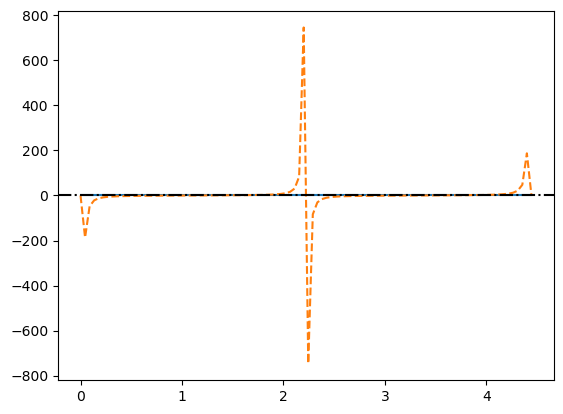

In [32]:
using HopTB,LinearAlgebra
using PyPlot
lat = [1.0 0.0 0.0; 0.0 1.0 0.0; 0.0 0.0 1.0]
BN = TBModel(2, lat)
# 子晶格 A 的位置 (在晶格点 [0, 0, 0])
setposition!(BN, [0, 0, 0], 1, 1, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 1, 1, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 1, 1, 3, (BN.lat * [0, 0, 0])[3])

# 子晶格 B 的位置 (在晶格点 [a/2, a/2, 0])
setposition!(BN, [0, 0, 0], 2, 2, 1, (BN.lat * [1/2, 1/2, 0])[1])
setposition!(BN, [0, 0, 0], 2, 2, 2, (BN.lat * [1/2, 1/2, 0])[2])
setposition!(BN, [0, 0, 0], 2, 2, 3, (BN.lat * [1/2, 1/2, 0])[3])


# Parameters
t = 0
λ =1
J1 = 0
J2 = 0

# 1. -t(cos(kx) + cos(ky)) * σ0
# 作用在哈密顿量的对角线元素上
sethopping!(BN, [1, 0, 0], 1, 1, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 1, 1, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [1, 0, 0], 2, 2, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 2, 2, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 2, 2, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 2, 2, -t) # 反向的ky跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 1, 1, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 1, 1, -t) # 反向的ky跳跃 (σ0)


# 2. (λ/2) * [sin(kx + ky) * σx + sin(ky - kx) * σy]
# 作用在哈密顿量的非对角线元素上 (σx, σy)

sethopping!(BN, [1, 1, 0], 1, 2, λ/(2*im))  # kx+ky方向上的跳跃 (σx0
sethopping!(BN, [-1, -1, 0], 1, 2, -λ/(2*im))  # 反向跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 2, 1, -λ/(2*im)) # 反向跳跃 (σx)
sethopping!(BN, [1, 1, 0], 2, 1, λ/(2*im))  # kx+ky方向上的跳跃 (σx)

sethopping!(BN, [1, -1, 0], 1, 2, -λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 1, 2, λ/2) # 反向跳跃 (σy)
sethopping!(BN, [1, -1, 0], 2, 1, λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 2, 1, -λ/2) # 反向跳跃 (σy)

# 3. J1 * (cos(kx) - cos(ky)) + J2 * sin(kx) * sin(ky) * σz
# 作用在哈密顿量的对角线元素上 (σz)
addhopping!(BN, [1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 1, 0], 1, 1, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 1, 1, -J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 1, 1, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 1, 1, J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, 0, 0], 2, 2, -J1)  # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 2, 2, -J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 1, 0], 2, 2, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 2, 2, J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 2, 2, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 2, 2, -J2)  # 反向跳跃 (σz)

kpath = zeros(Float64, 3, 2)
kpath[:, 1] = [0.0, 0.0, 0.0]  # M
kpath[:, 2] = [0.5, 0.5, 0.0]  # Γ


kdist, kpts = HopTB.Utilities.constructlinekpts(kpath,
        convert(Matrix{Float64}, BN.rlat), 100, connect_end_points=true)
nkpts = size(kpts, 2)
egvals = zeros(BN.norbits, nkpts)
    for ik in 1:nkpts
        k = kpts[:, ik]
        egvals[2, ik] = HopTB.getdEs(BN,1,1,1,k)[2]
    end
PyPlot.plot(kdist,egvals[1,:],linestyle="-")
PyPlot.plot(kdist,egvals[2,:],linestyle="--")
PyPlot.axhline(0.0,color="black",linestyle="-.")
PyPlot.show()

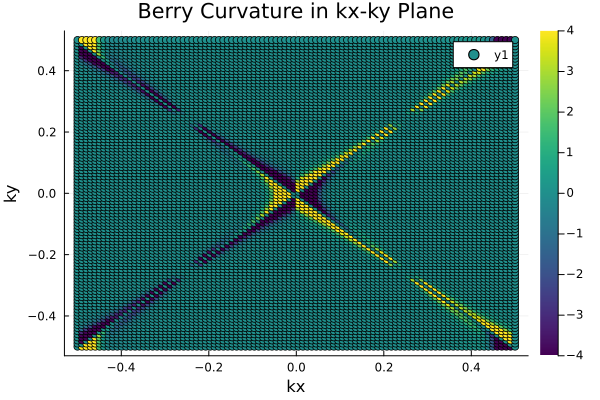

In [35]:
using HopTB,LinearAlgebra,PyPlot,Plots
lat = [1.0 0.0 0.0; 0.0 1.0 0.0; 0.0 0.0 1.0]
BN = TBModel(2, lat)
# 子晶格 A 的位置 (在晶格点 [0, 0, 0])
setposition!(BN, [0, 0, 0], 1, 1, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 1, 1, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 1, 1, 3, (BN.lat * [0, 0, 0])[3])

# 子晶格 B 的位置 (在晶格点 [a/2, a/2, 0])
setposition!(BN, [0, 0, 0], 2, 2, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 2, 2, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 2, 2, 3, (BN.lat * [0, 0, 0])[3])


# Parameters
t = 0.2
λ =0.2
J1 = 0.5
J2 = 0

# 1. -t(cos(kx) + cos(ky)) * σ0
# 作用在哈密顿量的对角线元素上
sethopping!(BN, [1, 0, 0], 1, 1, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 1, 1, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [1, 0, 0], 2, 2, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 2, 2, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 2, 2, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 2, 2, -t) # 反向的ky跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 1, 1, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 1, 1, -t) # 反向的ky跳跃 (σ0)


# 2. (λ/2) * [sin(kx + ky) * σx + sin(ky - kx) * σy]
# 作用在哈密顿量的非对角线元素上 (σx, σy)
sethopping!(BN, [1, 1, 0], 1, 2, λ/2/im )# kx+ky方向上的跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 1, 2, -λ/2/im)# 反向跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 2, 1, -λ/2/im) # 反向跳跃 (σx)
sethopping!(BN, [1, 1, 0], 2, 1, λ/2/im)  # kx+ky方向上的跳跃 (σx)

sethopping!(BN, [1, -1, 0], 1, 2, λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 1, 2, -λ/2) # 反向跳跃 (σy)
sethopping!(BN, [1, -1, 0], 2, 1, -λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 2, 1, λ/2) # 反向跳跃 (σy)


# 3. J1 * (cos(kx) - cos(ky)) + J2 * sin(kx) * sin(ky) * σz
# 作用在哈密顿量的对角线元素上 (σz)
addhopping!(BN, [1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 0, 0], 2, 2, -J1)  # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 2, 2, -J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 1, 0], 1, 1, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 1, 1, -J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 1, 1, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 1, 1, J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, 1, 0], 2, 2, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 2, 2, J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 2, 2, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 2, 2, -J2)  # 反向跳跃 (σz)

kpath = zeros(Float64, 3, 5)
kpath[:, 1] = [0.5, 0.5, 0.0]  # M
kpath[:, 2] = [0.0, 0.5, 0.0]  # X
kpath[:, 3] = [0.0, 0.0, 0.0]  # Γ
kpath[:, 4] = [0.5, 0.0, 0.0]  # Y
kpath[:, 5] = [0.5, 0.5, 0.0]  # Γ

# 定义 kx 和 ky 的取值范围
kx_range = range(-0.5, 0.5, length=100)
ky_range = range(-0.5, 0.5, length=100)

# 生成 kx 和 ky 的一维数组
kx = vec(kx_range)
ky = vec(ky_range)

# 创建 kx 和 ky 网格
kx_grid = [kx[i] for i in 1:length(kx), j in 1:length(ky)]
ky_grid = [ky[j] for i in 1:length(kx), j in 1:length(ky)]

# 将 kx 和 ky 转换为一维数组，并生成 kpts 矩阵
kx_flat = kx_grid[:]
ky_flat = ky_grid[:]
kz_flat = zeros(length(kx_flat))  # 假设 kz = 

kpts = hcat(kx_flat, ky_flat, kz_flat)'
berry_curvatures = Float64[]
# 计算 Berry 曲率
for i in 1:size(kpts, 2)
    k = kpts[:, i]
    curvature = HopTB.getdEs(BN,1,1,1,k)[1]*HopTB.get_berry_curvature(BN,1,2,k)[1]#需要第一条能带的 Berry \
    push!(berry_curvatures, curvature)
end
# 定义颜色范围和边界
# 生成图像
p = Plots.scatter(
    kx_flat, ky_flat,zcolor=berry_curvatures,
    color=:viridis,# 选择一个色图
    xlabel="kx",
    ylabel="ky",
    title="Berry Curvature in kx-ky Plane",
    clims=(-4, 4)  # 设置颜色条的范围
)

# 显示图像
display(p)


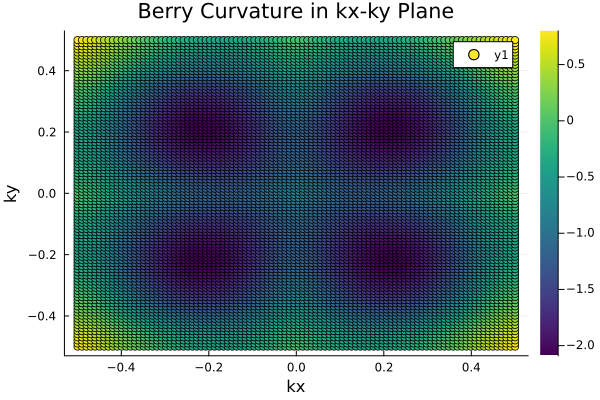

In [11]:
using HopTB
using Plots
using Colors
lat = [1.0 0.0 0.0; 0.0 1.0 0.0; 0.0 0.0 1.0]
BN = TBModel(2, lat)
# 子晶格 A 的位置 (在晶格点 [0, 0, 0])
setposition!(BN, [0, 0, 0], 1, 1, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 1, 1, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 1, 1, 3, (BN.lat * [0, 0, 0])[3])

# 子晶格 B 的位置 (在晶格点 [a/2, a/2, 0])
setposition!(BN, [0, 0, 0], 2, 2, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 2, 2, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 2, 2, 3, (BN.lat * [0, 0, 0])[3])


# Parameters
t = 0.2
λ =0.5
J1 = 0
J2 = 0.25
# 1. -t(cos(kx) + cos(ky)) * σ0
# 作用在哈密顿量的对角线元素上
sethopping!(BN, [1, 0, 0], 1, 1, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 1, 1, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [1, 0, 0], 2, 2, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 2, 2, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 2, 2, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 2, 2, -t) # 反向的ky跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 1, 1, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 1, 1, -t) # 反向的ky跳跃 (σ0)


# 2. (λ/2) * [sin(kx + ky) * σx + sin(ky - kx) * σy]
# 作用在哈密顿量的非对角线元素上 (σx, σy)
sethopping!(BN, [1, 1, 0], 1, 2, λ/2/im )# kx+ky方向上的跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 1, 2, -λ/2/im)# 反向跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 2, 1, -λ/2/im) # 反向跳跃 (σx)
sethopping!(BN, [1, 1, 0], 2, 1, λ/2/im)  # kx+ky方向上的跳跃 (σx)

sethopping!(BN, [1, -1, 0], 1, 2, λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 1, 2, -λ/2) # 反向跳跃 (σy)
sethopping!(BN, [1, -1, 0], 2, 1, -λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 2, 1, λ/2) # 反向跳跃 (σy)

# 3. J1 * (cos(kx) - cos(ky)) + J2 * sin(kx) * sin(ky) * σz
# 作用在哈密顿量的对角线元素上 (σz)
addhopping!(BN, [1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 0, 0], 2, 2, -J1)  # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 2, 2, -J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 1, 0], 1, 1, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 1, 1, -J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 1, 1, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 1, 1, J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, 1, 0], 2, 2, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 2, 2, J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 2, 2, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 2, 2, -J2)  # 反向跳跃 (σ





# 定义 kx 和 ky 的取值范围
kx_range = range(-0.5, 0.5, length=100)
ky_range = range(-0.5, 0.5, length=100)

# 生成 kx 和 ky 的一维数组
kx = vec(kx_range)
ky = vec(ky_range)

# 创建 kx 和 ky 网格
kx_grid = [kx[i] for i in 1:length(kx), j in 1:length(ky)]
ky_grid = [ky[j] for i in 1:length(kx), j in 1:length(ky)]

# 将 kx 和 ky 转换为一维数组，并生成 kpts 矩阵
kx_flat = kx_grid[:]
ky_flat = ky_grid[:]
kz_flat = zeros(length(kx_flat))  # 假设 kz = 0

kpts = hcat(kx_flat, ky_flat, kz_flat)'
berry_curvatures = Float64[]
# 计算 Berry 曲率
for i in 1:size(kpts, 2)
    k = kpts[:, i]
    curvature = HopTB.BandStructure.geteig(BN, k).values[1]  # 假设我们只需要第一条能带的 Berry曲
    push!(berry_curvatures, curvature)
end
# 定义颜色范围和边界
# 生成图像
p = Plots.scatter(
    kx_flat, ky_flat,zcolor=berry_curvatures,
    color=:viridis,# 选择一个色图
    xlabel="kx",
    ylabel="ky",
    title="Berry Curvature in kx-ky Plane"
)

# 显示图像
display(p)

In [46]:
using HopTB
using PyPlot
lat = [1.0 0.0 0.0; 0.0 1.0 0.0; 0.0 0.0 1.0]
BN = TBModel(2, lat)
# 子晶格 A 的位置 (在晶格点 [0, 0, 0])
setposition!(BN, [0, 0, 0], 1, 1, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 1, 1, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 1, 1, 3, (BN.lat * [0, 0, 0])[3])

# 子晶格 B 的位置 (在晶格点 [a/2, a/2, 0])
setposition!(BN, [0, 0, 0], 2, 2, 1, (BN.lat * [1/2, 1/2, 0])[1])
setposition!(BN, [0, 0, 0], 2, 2, 2, (BN.lat * [1/2, 1/2, 0])[2])
setposition!(BN, [0, 0, 0], 2, 2, 3, (BN.lat * [1/2, 1/2, 0])[3])


# Parameters
t = 0
λ =0.4
J1 = 0
J2 = 0
# 1. -t(cos(kx) + cos(ky)) * σ0
# 作用在哈密顿量的对角线元素上
sethopping!(BN, [1, 0, 0], 1, 1, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 1, 1, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [1, 0, 0], 2, 2, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 2, 2, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 2, 2, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 2, 2, -t) # 反向的ky跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 1, 1, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 1, 1, -t) # 反向的ky跳跃 (σ0)



# 2. (λ/2) * [sin(kx + ky) * σx + sin(ky - kx) * σy]
# 作用在哈密顿量的非对角线元素上 (σx, σy)
sethopping!(BN, [1, 1, 0], 1, 2, λ/2/im )# kx+ky方向上的跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 1, 2, -λ/2/im)# 反向跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 2, 1, -λ/2/im) # 反向跳跃 (σx)
sethopping!(BN, [1, 1, 0], 2, 1, λ/2/im)  # kx+ky方向上的跳跃 (σx)

sethopping!(BN, [1, -1, 0], 1, 2, λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 1, 2, -λ/2) # 反向跳跃 (σy)
sethopping!(BN, [1, -1, 0], 2, 1, -λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 2, 1, λ/2) # 反向跳跃 (σy)

# 3. J1 * (cos(kx) - cos(ky)) + J2 * sin(kx) * sin(ky) * σz
# 作用在哈密顿量的对角线元素上 (σz)
addhopping!(BN, [1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 0, 0], 2, 2, -J1)  # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 2, 2, -J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 1, 0], 1, 1, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 1, 1, -J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 1, 1, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 1, 1, J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, 1, 0], 2, 2, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 2, 2, J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 2, 2, -J2)    # kx+ky方向的跳跃 (σz
addhopping!(BN, [-1, 1, 0], 2, 2, -J2)  # 反向跳跃 (σz)


kpath = zeros(Float64, 3, 5)
kpath[:, 1] = [0.5, 0.5, 0.0]  # M
kpath[:, 2] = [0.5, 0.0, 0.0]  # X
kpath[:, 3] = [0.0, 0.0, 0.0]  # Γ
kpath[:, 4] = [0.0, 0.5, 0.0]  # Y
kpath[:, 5] = [0.5, 0.5, 0.0]  # Γ
kdist, egvals = HopTB.BandStructure.getbs(BN, kpath, 50, connect_end_points=true)

fig = figure("Band structure monolayer hBN",figsize=(10,20))

max_val=findmax(egvals[1,:])[1]
egvals=egvals.-0.019999999999999962

fermi_surfaces = HopTB.BandStructure.get_fermi_surfaces(BN, [50,50,50], [1,2]; fermi_energy=0.07999999999999996)
B=HopTB.Hall.get_berry_curvature_quadrupole(BN,1,2,1,2,fermi_surfaces)
print(B)    


LoadError: TaskFailedException

[91m    nested task error: [39mMethodError: no method matching typed_vcat(::Matrix{Float64}, ::Colon, ::Int64)
    
    [0mClosest candidates are:
    [0m  typed_vcat([91m::Type{T}[39m, ::Any...) where T
    [0m[90m   @[39m [90mBase[39m [90m[4mabstractarray.jl:1946[24m[39m
    [0m  typed_vcat([91m::Type{StaticArrays.SA}[39m, [91m::Number...[39m)
    [0m[90m   @[39m [36mStaticArrays[39m [90mC:\Users\woxin\.julia\packages\StaticArrays\MSJcA\src\[39m[90m[4minitializers.jl:34[24m[39m
    [0m  typed_vcat([91m::Type{StaticArrays.SA{T}}[39m, [91m::Number...[39m) where T
    [0m[90m   @[39m [36mStaticArrays[39m [90mC:\Users\woxin\.julia\packages\StaticArrays\MSJcA\src\[39m[90m[4minitializers.jl:35[24m[39m
    [0m  ...
    
    Stacktrace:
     [1] [0m[1m(::HopTB.Hall.var"#12#14"{TBModel{ComplexF64}, Int64, Int64, Int64, Int64, FermiSurface})[22m[0m[1m([22m[90mik[39m::[0mInt64[0m[1m)[22m
    [90m   @[39m [35mHopTB.Hall[39m [90mC:\Users\woxin\Documents\GitHub\HopTB.jl\src\[39m[90m[4mhall.jl:291[24m[39m
     [2] [0m[1mdo_work[22m[0m[1m([22m::[0mFunction, ::[0mDistributed.RemoteChannel[90m{Channel{Any}}[39m, ::[0mDistributed.RemoteChannel[90m{Channel{Any}}[39m[0m[1m)[22m
    [90m   @[39m [35mHopTB.Parallel[39m [90mC:\Users\woxin\Documents\GitHub\HopTB.jl\src\[39m[90m[4mparallel.jl:48[24m[39m
     [3] [0m[1m(::HopTB.Parallel.var"#1#2"{HopTB.Hall.var"#12#14"{TBModel{ComplexF64}, Int64, Int64, Int64, Int64, FermiSurface}, Distributed.RemoteChannel{Channel{Any}}, Distributed.RemoteChannel{Channel{Any}}, Tuple{}})[22m[0m[1m([22m[0m[1m)[22m
    [90m   @[39m [35mHopTB.Parallel[39m [90mC:\Users\woxin\Documents\GitHub\HopTB.jl\src\[39m[90m[4mparallel.jl:58[24m[39m
    Stacktrace:
     [1] [0m[1mtake_ref[22m[0m[1m([22m::[0mDistributed.RRID, ::[0mInt64[0m[1m)[22m
    [90m   @[39m [32mDistributed[39m [90mD:\Julia-1.10.4\share\julia\stdlib\v1.10\Distributed\src\[39m[90m[4mremotecall.jl:746[24m[39m
     [2] [0m[1mcall_on_owner[22m
    [90m   @[39m [90mD:\Julia-1.10.4\share\julia\stdlib\v1.10\Distributed\src\[39m[90m[4mremotecall.jl:563[24m[39m[90m [inlined][39m
     [3] [0m[1mtake![22m[0m[1m([22m::[0mDistributed.RemoteChannel[90m{Channel{Any}}[39m[0m[1m)[22m
    [90m   @[39m [32mDistributed[39m [90mD:\Julia-1.10.4\share\julia\stdlib\v1.10\Distributed\src\[39m[90m[4mremotecall.jl:761[24m[39m
     [4] [0m[1mclaim![22m[0m[1m([22m[90mpf[39m::[0mHopTB.Parallel.ParallelFunction[0m[1m)[22m
    [90m   @[39m [35mHopTB.Parallel[39m [90mC:\Users\woxin\Documents\GitHub\HopTB.jl\src\[39m[90m[4mparallel.jl:85[24m[39m
     [5] [0m[1m(::HopTB.Parallel.var"#20#22"{UnitRange{Int64}, HopTB.Parallel.ParallelFunction})[22m[0m[1m([22m[0m[1m)[22m
    [90m   @[39m [35mHopTB.Parallel[39m [90mC:\Users\woxin\Documents\GitHub\HopTB.jl\src\[39m[90m[4mparallel.jl:171[24m[39m

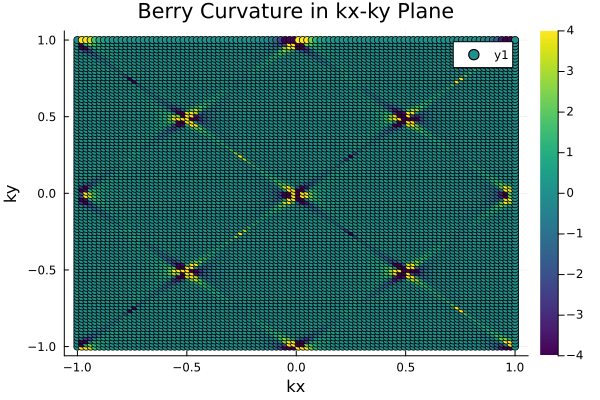

In [11]:
using HopTB
using Plots
using Colors
lat = [1.0 0.0 0.0; 0.0 1.0 0.0; 0.0 0.0 1.0]
BN = TBModel(2, lat)
# 子晶格 A 的位置 (在晶格点 [0, 0, 0])
setposition!(BN, [0, 0, 0], 1, 1, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 1, 1, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 1, 1, 3, (BN.lat * [0, 0, 0])[3])

# 子晶格 B 的位置 (在晶格点 [a/2, a/2, 0])
setposition!(BN, [0, 0, 0], 2, 2, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 2, 2, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 2, 2, 3, (BN.lat * [0, 0, 0])[3])


# Parameters
t = 0.4
λ =0.4
J1 = 0.5
J2 = 0
# 1. -t(cos(kx) + cos(ky)) 
# 作用在哈密顿量的对角线元素上
sethopping!(BN, [1, 0, 0], 1, 1, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 1, 1, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [1, 0, 0], 2, 2, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 2, 2, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 2, 2, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 2, 2, -t) # 反向的ky跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 1, 1, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 1, 1, -t) # 反向的ky跳跃 (σ0)


# 2. (λ/2) * [sin(kx + ky) * σx + sin(ky - kx) * σy]
# 作用在哈密顿量的非对角线元素上 (σx, σy)
sethopping!(BN, [1, 1, 0], 1, 2, -(λ/2)*im)# kx+ky方向上的跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 1, 2, -(-λ/2)*im)# 反向跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 2, 1, -(-λ/2)*im) # 反向跳跃 (σx)
sethopping!(BN, [1, 1, 0], 2, 1, -(λ/2)*im)  # kx+ky方向上的跳跃 (σx)

sethopping!(BN, [1, -1, 0], 1, 2, λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 1, 2, -λ/2) # 反向跳跃 (σy)
sethopping!(BN, [1, -1, 0], 2, 1, -λ/2) # kx-ky方向上的跳跃 (σy)
sethopping!(BN, [-1, 1, 0], 2, 1, λ/2) # 反向跳跃 (σy)

# 3. J1 * (cos(kx) - cos(ky)) + J2 * sin(kx) * sin(ky) * σz
# 作用在哈密顿量的对角线元素上 (σz)
addhopping!(BN, [1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 0, 0], 2, 2, -J1)  # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 2, 2, -J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 1, 0], 1, 1, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 1, 1, -J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 1, 1, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 1, 1, J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, 1, 0], 2, 2, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 2, 2, J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 2, 2, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 2, 2, -J2)  # 反向跳跃 (σz)!





# 定义 kx 和 ky 的取值范围
kx_range = range(-1,1 ,length=100)
ky_range = range(-1,1, length=100)

# 生成 kx 和 ky 的一维数组
kx = vec(kx_range)
ky = vec(ky_range)

# 创建 kx 和 ky 网格
kx_grid = [kx[i] for i in 1:length(kx), j in 1:length(ky)]
ky_grid = [ky[j] for i in 1:length(kx), j in 1:length(ky)]

# 将 kx 和 ky 转换为一维数组，并生成 kpts 矩阵
kx_flat = kx_grid[:]
ky_flat = ky_grid[:]
kz_flat = zeros(length(kx_flat))  # 假设 kz = 0

kpts = hcat(kx_flat, ky_flat, kz_flat)'
berry_curvatures = Float64[]
# 计算 Berry 曲率
for i in 1:size(kpts, 2)
    k = kpts[:, i]
    curvature = HopTB.get_berry_curvature_dipole2(BN,1,2,1,k)[2]# 假设我们只需要第一条能带的Berry曲率
    push!(berry_curvatures, curvature)
end
# 定义颜色范围和边界
# 生成图像
p = Plots.scatter(
    kx_flat, ky_flat,zcolor=berry_curvatures,
    color=:viridis,# 选择一个色图
    xlabel="kx",
    ylabel="ky",
    title="Berry Curvature in kx-ky Plane",
    clims=(-4, 4)  # 设置颜色条的范围
)

# 显示图像
display(p)

In [20]:
using HopTB

lat = [1.0 0.0 0.0; 0.0 1.0 0.0; 0.0 0.0 1.0]
BN = TBModel(2, lat)
# 子晶格 A 的位置 (在晶格点 [0, 0, 0])
setposition!(BN, [0, 0, 0], 1, 1, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 1, 1, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 1, 1, 3, (BN.lat * [0, 0, 0])[3])

# 子晶格 B 的位置 (在晶格点 [a/2, a/2, 0])
setposition!(BN, [0, 0, 0], 2, 2, 1, (BN.lat * [0, 0, 0])[1])
setposition!(BN, [0, 0, 0], 2, 2, 2, (BN.lat * [0, 0, 0])[2])
setposition!(BN, [0, 0, 0], 2, 2, 3, (BN.lat * [0, 0, 0])[3])


# Parameters
t = 0.2
λ = 0.5
J1 = 0.5
J2 = 0.25
# 1. -t(cos(kx) + cos(ky)) * σ0
# 作用在哈密顿量的对角线元素上
sethopping!(BN, [1, 0, 0], 1, 1, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 1, 1, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [1, 0, 0], 2, 2, -t)  # kx方向上的跳跃 (σ0)
sethopping!(BN, [-1, 0, 0], 2, 2, -t) # 反向的kx跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 2, 2, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 2, 2, -t) # 反向的ky跳跃 (σ0)
sethopping!(BN, [0, 1, 0], 1, 1, -t)  # ky方向上的跳跃 (σ0)
sethopping!(BN, [0, -1, 0], 1, 1, -t) # 反向的ky跳跃 (σ0)


# 2. (λ/2) * [sin(kx + ky) * σx + sin(ky - kx) * σy]
# 作用在哈密顿量的非对角线元素上 (σx, σy)
sethopping!(BN, [1, 1, 0], 1, 2, λ/2/im )# kx+ky方向上的跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 1, 2, -λ/2/im)# 反向跳跃 (σx)
sethopping!(BN, [-1, -1, 0], 2, 1, -λ/2/im) # 反向跳跃 (σx)
sethopping!(BN, [1, 1, 0], 2, 1, λ/2/im)  # kx+ky方向上的跳跃 (σx)

addhopping!(BN, [1, -1, 0], 1, 2, λ/2) # kx-ky方向上的跳跃 (σy)
addhopping!(BN, [-1, 1, 0], 1, 2, -λ/2) # 反向跳跃 (σy)
addhopping!(BN, [1, -1, 0], 2, 1, -λ/2) # kx-ky方向上的跳跃 (σy)
addhopping!(BN, [-1, 1, 0], 2, 1, λ/2) # 反向跳跃 (σy)

# 3. J1 * (cos(kx) - cos(ky)) + J2 * sin(kx) * sin(ky) * σz
# 作用在哈密顿量的对角线元素上 (σz)
addhopping!(BN, [1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 1, 1, J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 1, 1, -J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 0, 0], 2, 2, -J1)  # kx方向上的跳跃 (σz)
addhopping!(BN, [-1, 0, 0], 2, 2, -J1)   # kx方向上的跳跃 (σz)
addhopping!(BN, [0, 1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [0, -1, 0], 2, 2, J1)  # ky方向上的跳跃 (σz)
addhopping!(BN, [1, 1, 0], 1, 1, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 1, 1, -J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, -1, 0], 1, 1, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 1, 1, J2)  # 反向跳跃 (σz)
addhopping!(BN, [1, 1, 0], 2, 2, J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, -1, 0], 2, 2, J2)  # 反向跳跃 (σz
addhopping!(BN, [1, -1, 0], 2, 2, -J2)    # kx+ky方向的跳跃 (σz)
addhopping!(BN, [-1, 1, 0], 2, 2, -J2)  # 反向跳跃 (σz)

kpath = zeros(Float64, 3, 5)
kpath[:, 1] = [0.5, 0.5, 0.0]  # 
kpath[:, 2] = [0.5, 0.0, 0.0]  #  
kpath[:, 3] = [0.0, 0.0, 0.0]  #   
kpath[:, 4] = [0.0, 0.5, 0.0]  # 
kpath[:, 5] = [0.5, 0.5, 0.0]  #










#fermi_surface = HopTB.BandStructure.get_fermi_surfaces(BN, [50,50,50], [1,2]; fermi_energy=0.2)

#arr_range = range(-0.5, 0.5, length=50)
#arr = vec(arr_range)
#egvals=zeros(length(arr))
#    for ik in 1:length(arr)
#        fermi_energy = arr[ik]
#        fermi_surfaces = HopTB.BandStructure.get_fermi_surfaces(BN, [50,50,50], [1,2]; fermi_energy)
#        egvals[ik] = HopTB.Hall.get_berry_curvature_quadrupole(BN,1,2,1,1,fermi_surfaces)
#    end
#PyPlot.plot(arr,egvals[:],linestyle="-")
#PyPlot.axhline(0.0,color="black",linestyle="-.")
#PyPlot.show()   
#G1=HopTB.get_berry_curvature(BN,1,2,[0.1,0,0.15])[1]
#G2=HopTB.get_berry_curvature(BN,1,2,[0,-0.1,0.15])[1]
#G3=HopTB.get_berry_curvature(BN,1,2,[-0.1,0,0.15])[1]
#G4=HopTB.get_berry_curvature(BN,1,2,[0,0.1,0.15])[1]
#A=HopTB.Hall.get_berry_curvature_quadrupole(BN,1,2,1,1,fermi_surface)
#B=HopTB.Hall.get_berry_curvature_quadrupole(BN,1,2,2,2,fermi_surface)
#C=HopTB.getD(BN,1,[0.1,0,0.15])
#D=HopTB.getdHbar(BN,(1,0,0),[0.1,0,0.15]
#F=HopTB.getAw(BN,1,[0.1,0,0.15])
A=HopTB.getAw(BN, 1, [0.1,0,0.15])
B=HopTB.getdEs(BN,1,1,1,[0.1,0,0.15])
print(A,B)  

ComplexF64[0.0 - 0.0im 0.0 - 0.0im; 0.0 - 0.0im 0.0 - 0.0im][-0.3133377406363065, -0.3495678797006043]

In [1]:
-3.916969676937286 0.5937499999999999

LoadError: ParseError:
[90m# Error @ [0;0m]8;;file://C:/Users/woxin/Documents/GitHub/HopTB.jl/test/In[1]#1:19\[90mIn[1]:1:19[0;0m]8;;\
-3.916969676937286[48;2;120;70;70m 0.5937499999999999[0;0m
[90m#                 └─────────────────┘ ── [0;0m[91mextra tokens after end of expression[0;0m

In [ ]:
-0.34295028701622940.34295028701622940.6859005740324589-0.6859005740324589

In [ ]:
    for ik in 1:length(arr)
        fermi_energy = arr[ik]
        fermi_surfaces = HopTB.BandStructure.get_fermi_surfaces(BN, [50,50,50], [1,2]; fermi_energy)
        egvals[ik] = HopTB.Hall.get_berry_curvature_dipole(BN,1,2,2,fermi_surfaces)
    end
PyPlot.plot(arr,egvals[:],linestyle="-")
PyPlot.axhline(0.0,color="black",linestyle="-.")
PyPlot.show()